# 1. Literate Computing for Art and Science

<h3>Douglas Blank<br/>
Associate Processor, Computer Science<br/>
Bryn Mawr College<br/>
</h3>

http://goo.gl/hNNMY8

## 1.1 Literate Computing

**Literate Computing**: _a style of computation that can be enjoyably read by anyone._

> "The focus of **literate programming** is to document a program. In this manner, it is an inward-facing document, designed to explain itself. On the other hand, **literate computing** is meant to focus on the computational goals, rather than on the specific details of the program. The goal of literate computing is not to explain the workings of a program to programmers, but to explain a computational problem to a wide audience." - O'Hara, Blank, and Marshall (2015)

### 1.1.1 What?

Literate computing is not new. But new tools better integrate computation with writing. 

* One could manually construct a document with embedded code, equations, and media. 
* Mathematica notebook 

<img src="http://i.stack.imgur.com/gFHUz.png"/>

* Jupyter, an open source, language agnostic, project that includes notebook
* You are looking at a Jupyter Notebook using the Python3 kernel

### 1.1.2 Why?

* Makes results reproducible

> To convince someone of a particular result, those results should be reproducible. With the rise of "data-driven journalism" replication of results is critical. 

> Consider Reinhart and Rogoff's <a href="http://online.wsj.com/public/resources/documents/AER0413.pdf">Growth in a Time of Debt</a>. This paper has had a large impact in the way that we view the effectiveness of austerity in fiscal policy. However, Herndon, Ash, and Pollin reportedly found "spreadsheet errors, omission of available data, weighting, and transcription" in this paper. Corrected data significantly alter the results of the original findings.

* Can explain computation effectively
* Empowers the reader
* Excellent uses in education: assignments, lectures, flipped classroom
* Jupyter has thriving development, including over 40 programming languages, slideshow viewer, integration with github, and much more.

## 1.2 Sonification

In [1]:
%pylab inline
import math
import random
from IPython.display import IFrame

Populating the interactive namespace from numpy and matplotlib


In [2]:
IFrame("https://en.wikipedia.org/wiki/Sonification", width="100%", height=400)

# 2. Experiments

## 2.1 Sound via Functions

In [3]:
from IPython.display import DisplayObject

class Audio(DisplayObject):
    _read_flags = 'rb'
    
    def __init__(self, data=None, filename=None, url=None, embed=None, rate=None, autoplay=False, maxvalue=None):
        if filename is None and url is None and data is None:
            raise ValueError("No image data found. Expecting filename, url, or data.")
        if embed is False and url is None:
            raise ValueError("No url found. Expecting url when embed=False")

        if url is not None and embed is not True:
            self.embed = False
        else:
            self.embed = True
        self.autoplay = autoplay
        self.maxvalue = maxvalue
        super(Audio, self).__init__(data=data, url=url, filename=filename)

        if self.data is not None and not isinstance(self.data, bytes):
            self.data = self._make_wav(data,rate)

    def reload(self):
        """Reload the raw data from file or URL."""
        import mimetypes
        if self.embed:
            super(Audio, self).reload()

        if self.filename is not None:
            self.mimetype = mimetypes.guess_type(self.filename)[0]
        elif self.url is not None:
            self.mimetype = mimetypes.guess_type(self.url)[0]
        else:
            self.mimetype = "audio/wav"

    def _make_wav(self, data, rate):
        """ Transform a numpy array to a PCM bytestring """
        import struct
        from io import BytesIO
        import wave

        try:
            import numpy as np

            data = np.array(data, dtype=float)
            if len(data.shape) == 1:
                nchan = 1
            elif len(data.shape) == 2:
                # In wave files,channels are interleaved. E.g.,
                # "L1R1L2R2..." for stereo. See
                # http://msdn.microsoft.com/en-us/library/windows/hardware/dn653308(v=vs.85).aspx
                # for channel ordering
                nchan = data.shape[0]
                data = data.T.ravel()
            else:
                raise ValueError('Array audio input must be a 1D or 2D array')
            if self.maxvalue is None:
                maxvalue = np.max(np.abs(data))
            else:
                maxvalue = self.maxvalue
            scaled = np.int16(data/maxvalue * 32767).tolist()
        except ImportError:
            # check that it is a "1D" list
            idata = iter(data)  # fails if not an iterable
            try:
                iter(idata.next())
                raise TypeError('Only lists of mono audio are '
                    'supported if numpy is not installed')
            except TypeError:
                # this means it's not a nested list, which is what we want
                pass
            if self.maxvalue is None:
                maxvalue = float(max([abs(x) for x in data]))
            else:
                maxvalue = self.maxvalue
            scaled = [int(x/maxvalue * 32767) for x in data]
            nchan = 1

        fp = BytesIO()
        waveobj = wave.open(fp,mode='wb')
        waveobj.setnchannels(nchan)
        waveobj.setframerate(rate)
        waveobj.setsampwidth(2)
        waveobj.setcomptype('NONE','NONE')
        waveobj.writeframes(b''.join([struct.pack('<h',x) for x in scaled]))
        val = fp.getvalue()
        waveobj.close()
        return val

    def _data_and_metadata(self):
        """shortcut for returning metadata with url information, if defined"""
        md = {}
        if self.url:
            md['url'] = self.url
        if md:
            return self.data, md
        else:
            return self.data

    def _repr_html_(self):
        src = """
                <audio controls="controls" {autoplay}>
                    <source src="{src}" type="{type}" />
                    Your browser does not support the audio element.
                </audio>
              """
        return src.format(src=self.src_attr(),type=self.mimetype, autoplay=self.autoplay_attr())

    def src_attr(self):
        import base64
        if self.embed and (self.data is not None):
            data = base64=base64.b64encode(self.data).decode('ascii')
            return """data:{type};base64,{base64}""".format(type=self.mimetype,
                                                            base64=data)
        elif self.url is not None:
            return self.url
        else:
            return ""

    def autoplay_attr(self):
        if(self.autoplay):
            return 'autoplay="autoplay"'
        else:
            return ''
        
print("This cell defines the Audio class.")

This cell defines the Audio class.


### 2.1.1 White Noise

For these first experiments, we will create a series of functions that take a time argument and return a value representing sound at that time.

For example, here are a couple of functions that will generate noise at a couple of different volumes (note that t is ignored):

In [53]:
def noise50(t):
    return 0.5 * random.uniform(-1, 1)

def noise75(t):
    return 0.75 * random.uniform(-1, 1)

Let's test these out:

In [50]:
noise75(576457465476)

-0.25963995967660586

In [54]:
noise50(0)

-0.12930471751048123

We now have a couple of functions that give random values between -amplitude and +amplitude.

However, even before we begin to use these, we notice that there is a lot of repeated code. We could actually use our computational skills to abstract these into a function that creates functions:

In [55]:
def make_noise(amplitude=0.5):
    def f(t):
        return amplitude * random.uniform(-1, 1)
    return f

Now, we can use the function `make_noise` to create our functions for us:

In [60]:
noise50 = make_noise(0.5)
noise10 = make_noise(0.1)

And we can interactively test these as before.

In [57]:
noise50(0)

0.4566795868363519

Now, let's make a lot of noise!

We will use the standard of 44,100 data values per second, as most hardware can support that format.

We use Python's list comprehension to make a list of random values:

In [61]:
data = [noise10(t) for t in arange(0, 5, 1/44100)]

First, let's take a look at some of the data, the first 100 values (the plot command is part of matplotlib we we activated using `%pylab inline` magic):

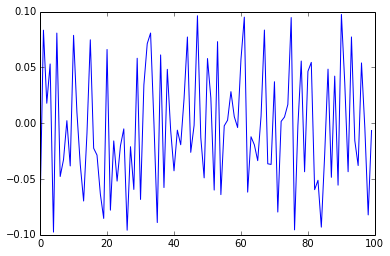

In [62]:
plot(data[:100])

And now we can play it using the Audio class:

In [63]:
Audio(data, rate=44100, maxvalue=1)

Audio can also take a two-dimensional array of numbers to create stereo audio.

In [64]:
data2 = [noise50(t) for t in arange(0, 5, 1/44100)]

In [65]:
Audio([data, data2], rate=44100)

Does it sound fundamentally different from mono noise?

### 2.1.2 Perlin Noise

This next code won an Academy Award for Technical Acheivement.

In [66]:
IFrame("https://en.wikipedia.org/wiki/Perlin_noise", width="100%", height="400")

We're going to use use open source code for generating the Perlin Noise. In fact, we will automate getting the code in this notebook as well. We use the `!` symbol to indicate that this is a shell command:

In [67]:
! wget https://raw.githubusercontent.com/caseman/noise/master/perlin.py 

--2015-07-09 15:44:11--  https://raw.githubusercontent.com/caseman/noise/master/perlin.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 23.235.46.133
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|23.235.46.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11694 (11K) [text/plain]
Saving to: ‘perlin.py.1’

100%[======================================>] 11,694      --.-K/s   in 0s      

2015-07-09 15:44:11 (298 MB/s) - ‘perlin.py.1’ saved [11694/11694]



Now that we have that code, we can simply import it, and use it:

In [68]:
from perlin import *

In [69]:
ngen = SimplexNoise()

I played around with the resolution to find values that would give good values for random sounds:

In [72]:
%%time
data = [ngen.noise2(t/200, 0) for t in arange(0, 44100 * 5)]

CPU times: user 6.41 s, sys: 0 ns, total: 6.41 s
Wall time: 6.41 s


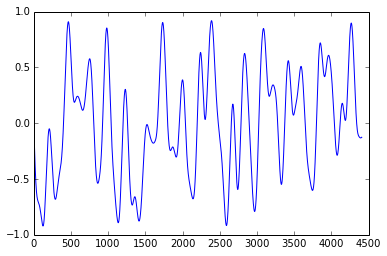

In [75]:
plot(data[:4410])

What do you think this will sounds like?

In [76]:
Audio(data, rate=44100)

### 2.1.3 Tones

We made some noise, but now let's make music.

Tones are generated by creating waves at a particular frequency.

First, as before, we define a function that can make functions:

In [77]:
def make_tone(frequency):
    def f(t):
        return math.sin(2 * math.pi * frequency * t)
    return f

In [78]:
tone440 = make_tone(440)

Let's take a look at 1/100 of a second of this tone:

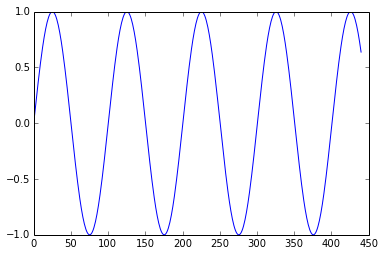

In [79]:
plot([tone440(t) for t in arange(0, .01, 1/44100)])

In [80]:
Audio([tone440(t) for t in arange(0, 5, 1/44100)], rate=44100)

### 2.1.4 Binaural beats

In [81]:
from IPython.display import IFrame
IFrame("http://en.wikipedia.org/wiki/Binaural_beats", width="100%", height="400")

In [82]:
tone220 = make_tone(220)
tone221 = make_tone(221)
data220 = [tone220(t) for t in arange(0, 5, 1/44100)]
data221 = [tone221(t) for t in arange(0, 5, 1/44100)]

In [85]:
Audio([data220, data221], rate=44100)

In [87]:
def array_add(a1, a2):
    return [a1[i] + a2[i] for i in range(len(a1))]

In [88]:
Audio(array_add(data220, data221), rate=44100)

In [89]:
# (6.0, 4.0)
rcParams["figure.figsize"] = (12.0, 4.0)

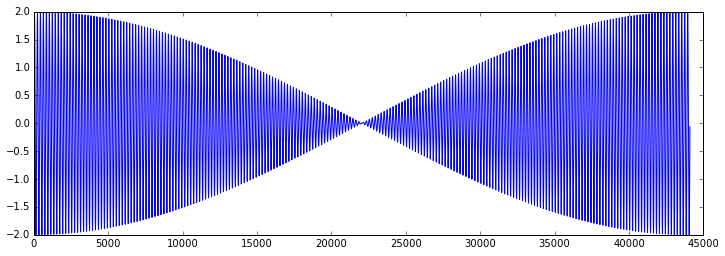

In [90]:
plot(array_add(data220, data221)[:44100])

In [91]:
rcParams["figure.figsize"] = (6.0, 4.0)

In [92]:
tone300 = make_tone(300)
tone310 = make_tone(310)
data300 = [tone300(t) for t in arange(0, 5, 1/44100)]
data310 = [tone310(t) for t in arange(0, 5, 1/44100)]

In [93]:
Audio([data300, data310], rate=44100)

In [ ]:
Audio(array_add(data300, data310), rate=44100)

## 2.2 Array-based Mathematics

In [94]:
framerate = 44100
t = np.linspace(0, 5, framerate * 5)
tone = np.sin(2 * np.pi * 440 * t)

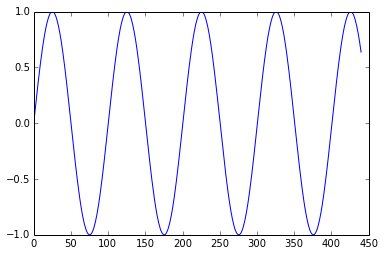

In [95]:
plot(tone[:441])

In [96]:
antitone = np.sin(2 * np.pi * 440 * t + np.pi)

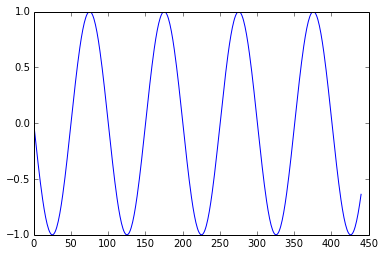

In [97]:
plot(antitone[:441])

In [98]:
Audio(tone, rate=framerate)

In [99]:
Audio(antitone, rate=framerate)

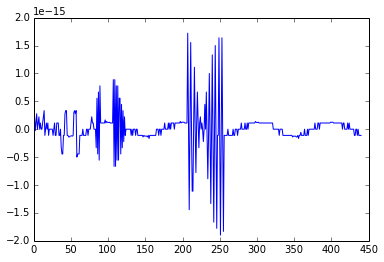

In [100]:
plot((tone + antitone)[:441])

In [101]:
Audio(tone + antitone, rate=framerate)

In [102]:
Audio(tone + antitone, rate=framerate, maxvalue=1.0)

### 2.2.1 Sequence of Tones

Consider the following code:

In [103]:
framerate = 44100
t = np.linspace(0, 5, framerate * 5)
chunk = np.sin(2 * np.pi * 440 * t)
data = np.array(0)
for i in range((44100 * 5)//870 + 1):
    data = np.append(data, chunk[:870])

We see that we interrupt the tone after 870 data points to restart the tone again at zero. Here is what that looks like at one of the interruptions:

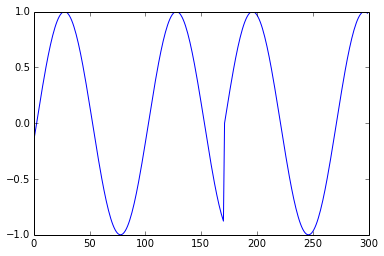

In [104]:
plot(data[700:1000])

That won't sound like the pure tone it should be:

In [105]:
Audio(data, rate=44100)

To make smooth transitions between two tones (or even the same tone) we need to keep track of where we are in the sin curve. 

In [106]:
def make_tone(t, frequency):
    return math.sin(2 * math.pi * frequency * t)

data = []
freq = 220
for t in arange(0, 5, 1/44100):
    if t % 1.0 == 0:
        freq = freq * 2
    data.append(make_tone(t, freq))


Now we look at the transition point between two tones:

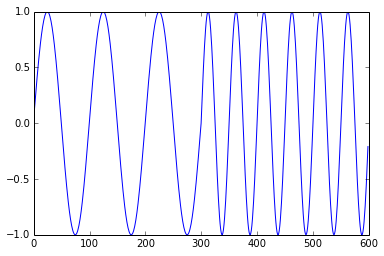

In [107]:
plot(data[44100 - 300:44100 + 300])

Nice and smooth! Notice that doubling the frequency exactly raises the tone to the next octave.

In [108]:
Audio(data, rate=44100)

Just as a double check, we can look at the spectrogram of the resulting sound:

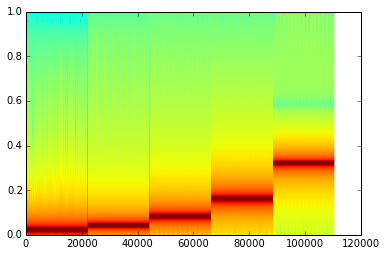

In [109]:
power, freqs, bins, im = specgram(data)

Let x<sub>0</sub>, ...., x<sub>N-1</sub> be complex numbers. The DFT is defined by the formula

$ X_k =  \sum_{n=0}^{N-1} x_n e^{-{i 2\pi k \frac{n}{N}}} \qquad k = 0,\dots,N-1. $


### 2.2.2 Random Tones

We return to Perlin Noise to make music that no human would ever create.

In [110]:
ngen = SimplexNoise()

data = []
for t in arange(0, 44100 * 5):
    freq = ngen.noise2(t/700000, 0) * 800 + 800
    data.append(make_tone(t, freq))

In [111]:
Audio(data, rate=44100)

What do you think of that? Could a computer ever create music as beautiful as Bach? Maybe, but obviously not in this manner.

Here is that "music" as seen in a spectrogram:

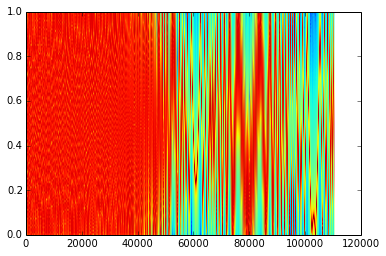

In [112]:
power, freqs, bins, im = specgram(data)

### 2.2.3 Sonification: Listening to Climate Change

This idea was proposed by Rhine Singleton, Franklin Pierce University. Our goal is to listen to climate change.

First, we use Rhine's data from a spreadsheet representing the years and global average temperature.

In [115]:
import csv

In [119]:
data = []
with open("nasa climate data four.csv") as fp:
    for row in csv.reader(fp):
        data.append(row)

In [120]:
time = [int(row[0]) for row in data]

In [121]:
temps = [float(row[3]) for row in data]

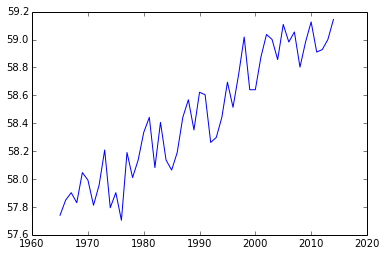

In [122]:
plot(time, temps)

In [123]:
len(temps)

50

In [124]:
data = []
for t in arange(0, 5, 1/44100):
    temp_index = floor(t/5.0 * len(temps))
    ratio = (temps[temp_index] - min(temps))/(max(temps) - min(temps))
    data.append(make_tone(t, ratio * 16000 + 400)) 

In [125]:
Audio(data, rate=44100)

And again, a double check to make sure that we have the data correct:

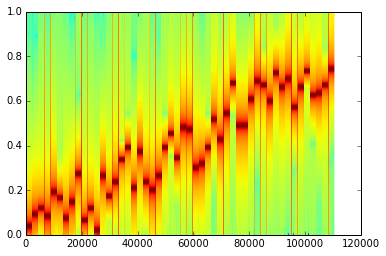

In [126]:
power, freqs, bins, im = specgram(data)

# 3. Reflection

1. Could sonification be used to make data more understandable?

<h1>References</h1>

Keith J. O’Hara, Douglas Blank, and James Marshall. [Computational Notebooks for AI Education](https://www.researchgate.net/publication/271446724_Computational_Notebooks_for_AI_Education). Proceedings of the Twenty-Eighth International Florida Artificial Intelligence Research Society Conference, FLAIRS 2015, Hollywood, Florida. May 2015. 

[Rhine Singleton](http://www.franklinpierce.edu/academics/bios/singleton.htm). http://www.ecologyandevolution.org/sonification.html